# Tarea 3

**Envío del PR inicial:** viernes 21 de septiembre

**Aceptación del PR:** martes 25 de septiembre

In [46]:
using Plots
using PlotRecipes
using LaTeXStrings
gr()

Plots.GRBackend()

In [47]:
#"Módulo" Diferenciación Automática
import Base: +, -, *, /, ^
import Base.show
import Base: sqrt, exp, log, sin, cos, sinh, cosh

"""
    Dual

Definición de los números duales. Los campos internos son
    x  :: Float64   # valor de la función
    x′ :: Float64   # valor de su derivada

"""
struct Dual
    x  :: Float64
    x′ :: Float64
end

Dual(c::Real) = Dual(c, 0.0)
dual(x0::Real) = Dual(x0, 1.0)

+(u::Dual, v::Dual) = Dual( u.x + v.x, u.x′ + v.x′)

-(u::Dual, v::Dual) = Dual( u.x - v.x, u.x′ - v.x′)

*(u::Dual, v::Dual) = Dual( u.x * v.x, u.x * v.x′ + u.x′ * v.x)

function /(u::Dual, v::Dual)
    y = u.x / v.x
    Dual( y, (u.x′ - y * v.x′)/v.x )
end

function ^(a::Dual, n::Int)
    y = a.x^(n-1)
    Dual(a.x * y, n*y*a.x′)
end

#+
+(a::Real, u::Dual) = Dual( a + u.x, u.x′)
+(u::Dual, a::Real) = Dual( a + u.x, u.x′)
#-
-(a::Real, u::Dual) = Dual( a - u.x, -u.x′)
-(u::Dual, a::Real) = Dual( u.x - a, u.x′)
#*
*(a::Real, u::Dual) = Dual(u.x*a,u.x′*a)
*(u::Dual, a::Real) = Dual(u.x*a,u.x′*a)
#/
function /(a::Real,u::Dual)
    y = a / u.x
    Dual( y, (-y * u.x′)/u.x )
end
/(u::Dual, a::Real)=Dual( u.x/a, u.x′/a )

function show(u::Dual)
    print(string(u.x)*" + "*string(u.x′)*"ε")
end

sqrt(u::Dual)=Dual(sqrt(u.x),u.x′/(2*sqrt(u.x)))
exp(u::Dual)=Dual(exp(u.x),u.x′*exp(u.x))
log(u::Dual)=Dual(log(u.x),u.x′/u.x)
sin(u::Dual)=Dual(sin(u.x),u.x′*cos(u.x))
cos(u::Dual)=Dual(cos(u.x),-u.x′*sen(u.x))
sinh(u::Dual)=Dual(sinh(u.x),u.x′*cosh(u.x))
cosh(u::Dual)=Dual(cosh(u.x),u.x′*sinh(u.x))

"Método de Newton con Duales a partir de una función real f y un valor inicial x=0."
function newton(f,x0,tol=1e-16)
    fprime(x)=f(dual(x)).x′
    xn=x0
    while abs(f(xn))>tol
        xn=xn-f(xn)/fprime(xn)
    end
    return xn
end

"A partir de una función real f, y un rango x0, devuelven las raíces encontradas"
function soluciones(f,x0)
    raiz=[]
    raices=[]
    for i in x0
        r=newton(f,i)
        if abs(r)≠Inf
            push!(raiz,r)
        end
    end
    push!(raices,raiz[1])
    for i in 1:size(raiz,1)-1
        if abs(raiz[i]-raiz[i+1])>1e-10
            a=true
            b=true
            for j in raices
                if abs(raiz[i+1]-j)>1e-10
                    a=true
                else
                    a=false
                b=(a & b)
                end
            end
            if b==true
                push!(raices,raiz[i+1])
            end
        end
    end
    return raices
end

soluciones

## 1

Consideren el mapeo $F(x) = x^2-2$ definido en el intervalo $[-2,2]$. 

- ¿Qué podemos concluir después de muchos iterados para las condiciones iniciales $x_0=0$, $x_0=0.1$, $x_0=0.001$?
    
- ¿Qué propiedad hace que el interés en este mapeo sea el intervalo [-2,2]$


In [48]:
f(x)=x^2-2
function mapeos(f,x0,iteraciones)
    x=x0
    for i in 1:iteraciones
        x=f(x)
    end
    return x
end

mapeos (generic function with 1 method)

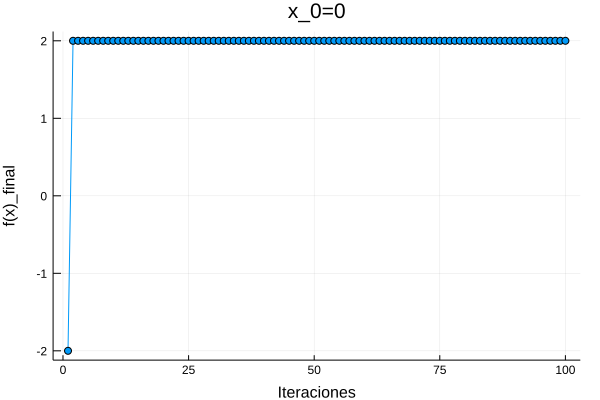

In [49]:
x0=[]
for i in 1:100
    push!(x0,mapeos(f,0,i))
end
x=1:100
plot(x,x0,xaxis="Iteraciones",yaxis="f(x)_final",legend=false,title="x_0=0",marker=:dot)

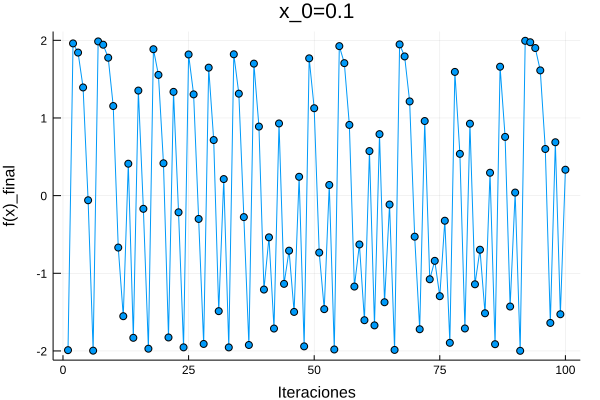

In [50]:
x0=[]
for i in 1:100
    push!(x0,mapeos(f,0.1,i))
end
x=1:100
plot(x,x0,xaxis="Iteraciones",yaxis="f(x)_final",legend=false,title="x_0=0.1",marker=:dot)

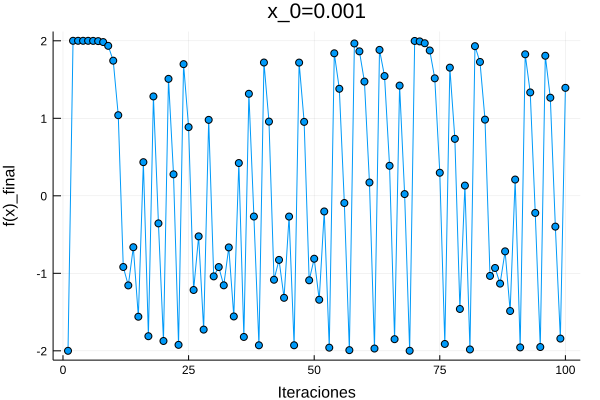

In [51]:
x0=[]
for i in 1:100
    push!(x0,mapeos(f,0.001,i))
end
x=1:100
plot(x,x0,xaxis="Iteraciones",yaxis="f(x)_final",legend=false,title="x_0=0.001",marker=:dot)

Lo interesante de esta función es que se mapea a sí misma siempre en el mismo intervalo: [-2,2]; siempre está oscilando entre esos valores.

## 2

Escriban una función cuyos argumentos son la función `F` del mapeo, `x0`, la condición inicial, y `n` el número de iterados del mapeo (un número entero), que genere los `n` iterados del mapeo y haga el análisis gráfico descrito del mapeo. Ilustren el funcionamiento con $F(x)=\sqrt{x}$.

¿Qué pueden concluir de iterar *muchas* veces una condición inicial?

In [52]:
function analisisgrafico(f,x0,n,recta=true)
    x0s=[]
    fs=[]
    x02s=[]
    f2s=[]
    for i in 1:n
        push!(x0s,x0)
        push!(x02s,x0)
        push!(x02s,x0)
        x0=f(x0)
        push!(f2s,x0)
        push!(f2s,x0)
        push!(fs,x0)
    end
    a=minimum(x0s)
    a=floor(a)
    b=maximum(x0s)
    b=floor(1+b)
    rangox=a:(1/(2^10)):b
    y=f.(rangox)
    plot(rangox,f,legend=false,xaxis="x_0",yaxis="f(x_0)",title="Órbitas")
    for i in 1:(n-1)
        plot!([x0s[i]],[fs[i]],marker=(:dot,:red))
    end
    x02s=x02s[1:2n]
    pop!(f2s)
    insert!(f2s,1,x02s[1])
    if recta==true
        plot!(rangox,rangox,color=:green)
    else recta==false
        plot!(rangox,-rangox,color=:green)
    end
    plot!(x02s,f2s,line=(:purple,:path,:dot))
    plot!(x02s,x02s,marker=(:dot,:yellow),line=false)
    plot!([x02s[1]],[x02s[1]],marker=(:dot,:pink,7))
end

analisisgrafico (generic function with 2 methods)

In [53]:
function orbitas(f,x0,n)
    x0s=[]
    fs=[]
    x02s=[]
    f2s=[]
    for i in 1:n
        push!(x0s,x0)
        push!(x02s,x0)
        push!(x02s,x0)
        x0=f(x0)
        push!(f2s,x0)
        push!(f2s,x0)
        push!(fs,x0)
    end
    a=minimum(x0s)
    a=floor(a)
    b=maximum(x0s)
    b=floor(1+b)
    rangox=a:(1/(2^10)):b
    y=f.(rangox)
    x02s=x02s[1:2n]
    pop!(f2s)
    insert!(f2s,1,x02s[1])
    return rangox, x0s, fs, x02s, f2s
end

orbitas (generic function with 1 method)

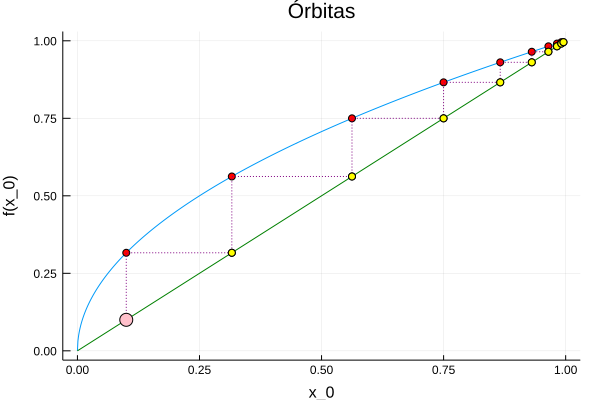

In [54]:
f(x)=sqrt(x)
analisisgrafico(f,0.1,10)

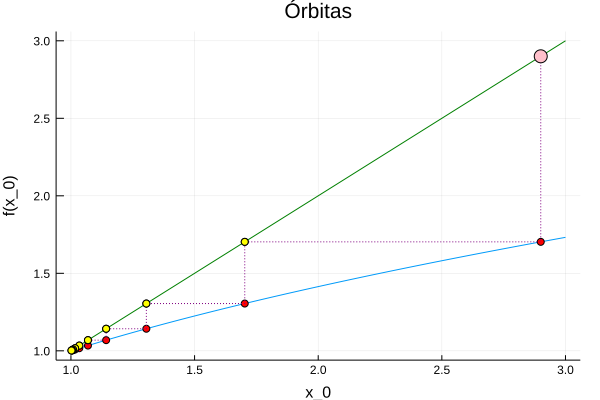

In [55]:
f(x)=sqrt(x)
analisisgrafico(f,2.9,10)

## 3

- Usen el análisis gráfico para encontrar los puntos de periodo dos del mapeo $F(x) = x^2 -1.1$. Den explícitamente los puntos fijos.
    
- Usen el método de Newton, usando iterados iniciales  sagazmente seleccionados, para obtener los puntos fijos.

In [56]:
g(x)=x^2-1.1
h(x)=g(x)-x
sols=soluciones(h,-3:0.5:3)
for i in sols
    print(i)
    println()
end

-0.6618950038622251
1.661895003862225


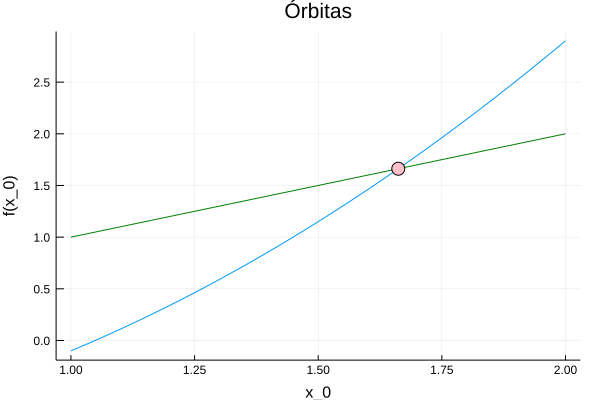

In [57]:
analisisgrafico(g,1.661895,10)

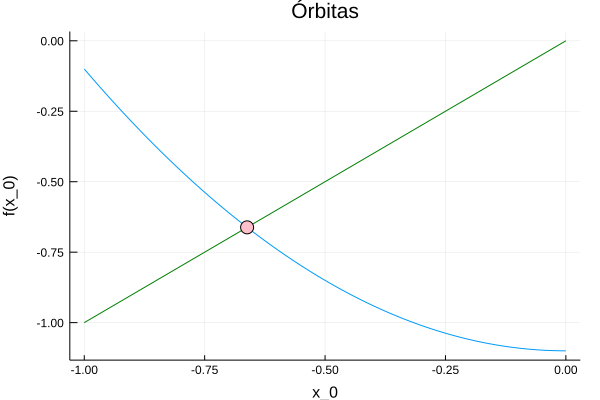

In [58]:
analisisgrafico(g,-0.661895,10)

In [59]:
h(x)=(x^2-1.1)^2-1.1-x
soluciones(h,-5:0.125:5)

4-element Array{Any,1}:
 -1.09161 
  1.6619  
 -0.661895
  0.091608

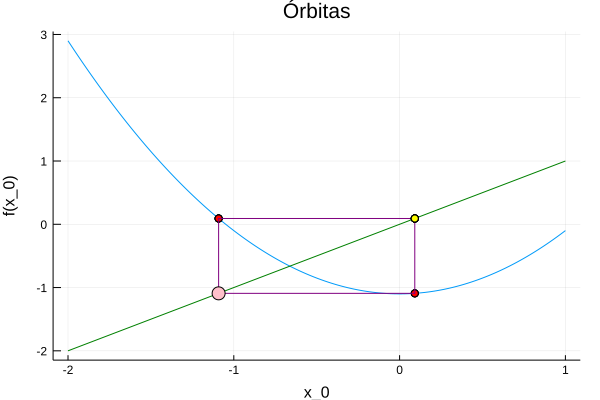

In [60]:
analisisgrafico(g,-1.09161,10)

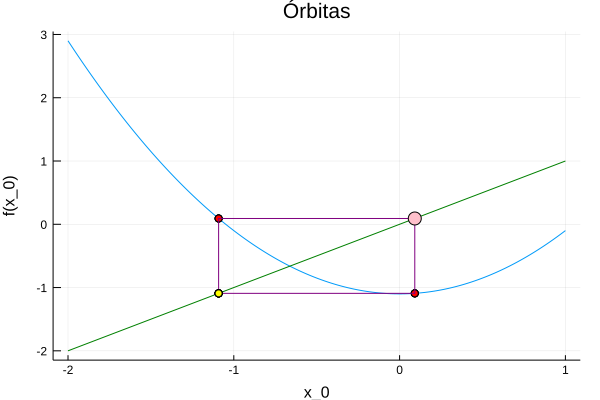

In [61]:
analisisgrafico(g,0.09161,10)

Tenemos que los puntos fijos son 1.661895 y -0.661895; y los puntos de periodo dos son: 0.091608 y -1.091608.

## 4

Hagan un análisis completo de las posibles órbitas de los siguientes mapeos, usando distintos colores para distintas órbitas. Interesa entre otras cosas saber cuántos puntos fijos tiene y cómo es la dinámica cerca de ésos puntos.

- $F_1(x) = \frac{1}{3x}$.

- $F_2(x) = -\frac{x^5}{5}$.

- $F_3(x) = \frac{x}{2}-2$.

In [62]:
"""
Se traza un diagrama con los siguientes parámetros:
f: La función a trazar e iterar.
rango: El conjunto de puntos iniciales desde los que se itera.
pasos: El número de iteraciones a realzar.
recta: true para una recta positiva, false para una recta negativa.
puntos: true para marcar los puntos intermedios de la trayectoria, false para no marcarlos y señalar sólo el inicial y final.
"""
function diagramaorbitas(f,rango,pasos,recta=true,puntos=false)
    rangox, x0s, fs, x02s, f2s=orbitas(f,rango[1],pasos)
        if recta==true
        plot(rangox,rangox,color=:green)
        else
        plot(-rangox,rangox,color=:green)
        end    
        for j in rango
        rangox, x0s, fs, x02s, f2s=orbitas(f,j,pasos)
        a=rand()
        b=rand()
        c=rand()
        n=length(x0s)
        k=length(x02s)
        plot!(rangox,f,legend=false,color=:blue)
        if recta==true
            plot!(rangox,rangox,color=:green)
        else
            plot!(-rangox,rangox,color=:green)
        end
        if puntos==true
            for i in 1:(n-1)
                plot!([x0s[i]],[fs[i]],marker=(:dot),color=RGB(a,b,c))
            end
            #plot!(x02s,x02s,marker=(:dot),line=false,color=RGB(a,b,c))
            plot!([x02s[1]],[x02s[1]],marker=(:dot,7),color=RGB(a,b,c))
            plot!([x02s[k]],[f2s[k]],marker=(:dot,7),color=RGB(a,b,c))
        else
            plot!([x02s[1]],[x02s[1]],marker=(:dot),color=RGB(a,b,c))
            plot!([x02s[k]],[f2s[k]],marker=(:dot),color=RGB(a,b,c))
        end
        plot!(x02s,f2s,line=(:path,:dot),color=RGB(a,b,c))
    end
    plot!(rangox,f,legend=false,color=:blue,xaxis="x_0",yaxis="f(x_0)",title="Órbitas")
    
end

f1(x)=1/(3*x)
f2(x)=-x^5/5
f3(x)=x/2 -2

g1(x)=x*(f1(x)-x)
g2(x)=x^5/5-x
g3(x)=f3(x)-x

g3 (generic function with 1 method)

In [63]:
soluciones(g1,-5:0.125:5)

3-element Array{Any,1}:
 -0.57735
  0.0    
  0.57735

Como vemos, para $\frac{1}{3x}$ los puntos fijos son: $-0.57735$ y $0.57735$

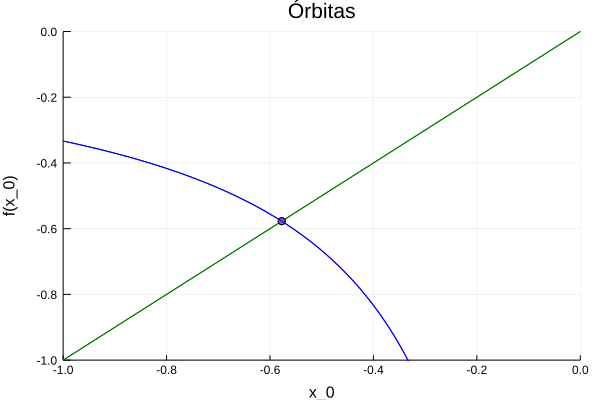

In [64]:
diagramaorbitas(f1,[-.57735],11)
plot!(xlims=(-1,0),ylims=(-1,0))

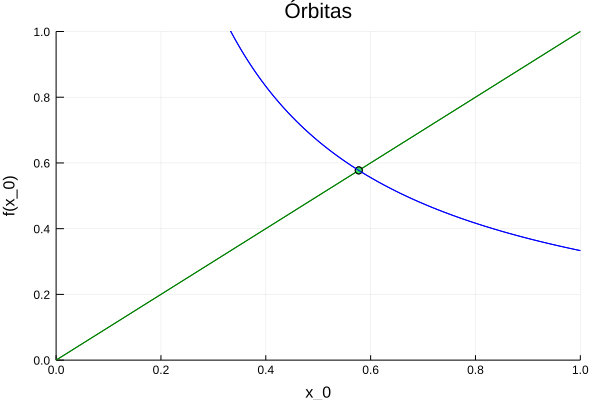

In [65]:
diagramaorbitas(f1,[.57735],11)
plot!(xlims=(0,1),ylims=(0,1))

Todos los demás puntos dan órbitas de periodo 2; se muestran dos ejemplos a continuación:

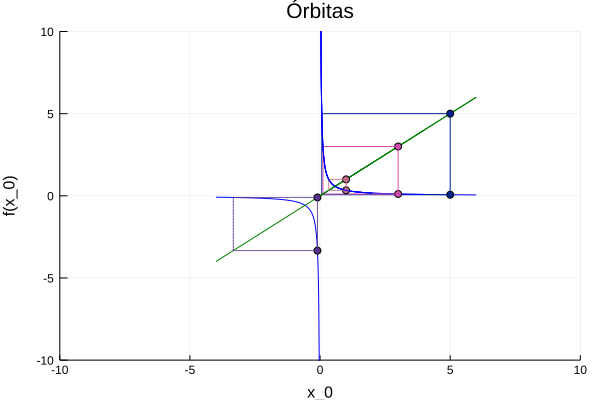

In [66]:
diagramaorbitas(f1,[5,3,-.1,1],11)
plot!(xlims=(-10,10),ylims=(-10,10))

In [67]:
soluciones(g2,-5:0.0625:5)

3-element Array{Any,1}:
 -1.49535
  1.49535
  0.0    

Tenemos órbitas cerradas en: $-1.49535, 0$ y $1.49535$ donde 0 es un punto fijo.

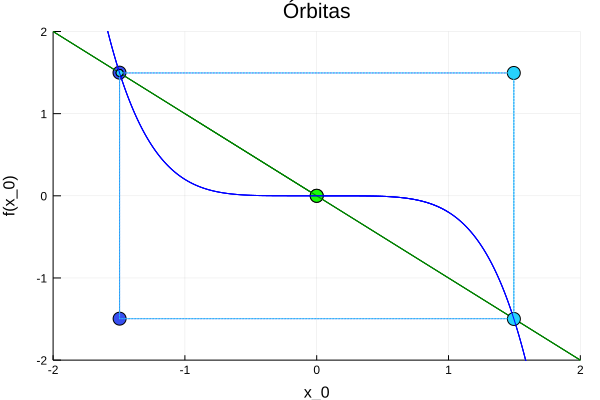

In [68]:
diagramaorbitas(f2,[-1.49535,0,1.49535],5,false,true)
plot!(xlims=(-2,2),ylims=(-2,2))

In [69]:
diagramaorbitas(f2,-2:0.25:2,2,false)
plot!(xlims=(-10,10),ylims=(-10,10))

Del diagrama anterior vemos que el $0$ es un punto fijo atractivo, y los otros dos puntos son repulsivos para valores mayores al valor absoluto

In [70]:
diagramaorbitas(f2,-1.4:0.5:1.4,10)
plot!(xlims=(-5,5),ylims=(-5,5))

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


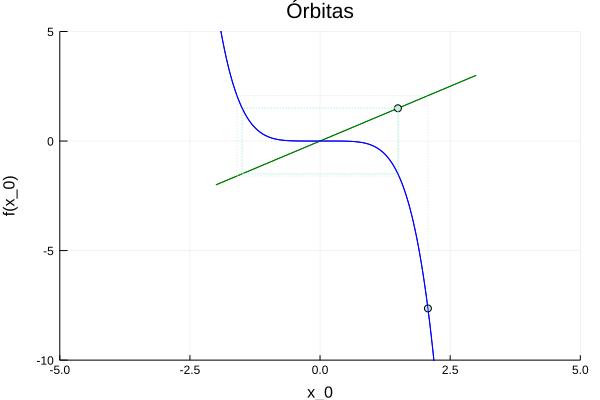

In [71]:
diagramaorbitas(f2,[1.49538],7)
plot!(xlims=(-5,5),ylims=(-10,5))

In [72]:
soluciones(g3,-5:0.125:5)

1-element Array{Any,1}:
 -4.0

Vemos que tenemos un punto fijo en $-4$ y que es un atractor.

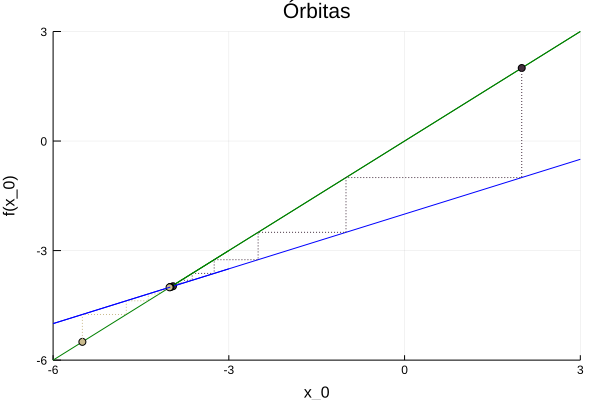

In [73]:
diagramaorbitas(f3,[2,-4,-5.5],8)
plot!(xlims=(-6,3),ylims=(-6,3))

## 5

- Para el mapeo mapeo $F(x) = x^2-2$ en el intervalo $[-2,2]$ (ejercicio 1), consideren un punto al azar en el intervalo $[-2,2]$ y construyan una órbita muy larga, por ejemplo, de $20\,000$ iterados. Obtengan el histograma de frecuencia (normalizado) de visita de los puntos de la órbita. ¿Qué conclusión podemos sacar de este histograma?

- \Repitan el inciso anterior para el mapeo: $G(x) = 2x \mod 1$ en el intervalo [0,1].

(NOTA: En cuanto al histograma, pueden construir su propia función que haga el histograma, o buscar en las entrañas de la documentación.)

In [74]:
function frecuencia(conjunto)
    frecuencia=[]
    push!(frecuencia,[conjunto[1],1])
    k=1
    for i in 1:size(conjunto,1)-1
            a=true
            b=true
            for j in 1:size(frecuencia,1)
                if abs(conjunto[i+1]-frecuencia[j][1])>1e-10
                    a=true
                else
                    a=false
                    k=j
                end
                b=(a & b)
            end
            if b==true
                push!(frecuencia,[conjunto[i+1],1])
            else
                frecuencia[k][2]=frecuencia[k][2]+1
            end
        end
    datos=[]
    repeticion=[]
    for i in 1:size(frecuencia,1)
        push!(datos,frecuencia[i][1])
        push!(repeticion,frecuencia[i][2])
    end
    return datos, repeticion
end

function histograma(f,x0,n)
    x0s=[]
    fs=[]
    for i in 1:n
        push!(x0s,x0)
        x0=f(x0)
        push!(fs,x0)
    end
    x=frecuencia(fs)
    y=x[2]./n
    return x[1],y
end

histograma (generic function with 1 method)

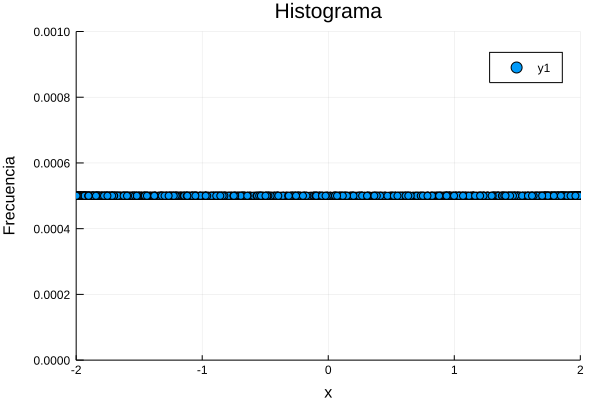

In [75]:
f(x)=x^2-2
x=histograma(f,0.01,2000)
plot(x[1],x[2],marker=:dot,line=false)
#bar(x[1],x[2])
plot!(xlims=(-2,2),ylims=(0,0.001),xaxis="x",yaxis="Frecuencia",title="Histograma")

## 6

Analicen los mapeos

- F(x) = x^2,

- F(x) = x^3,

- F(x) = -x^3,

que se satisface $F(0) = F'(0) = 0$. ¿Qué podemos decir de la convergencia?

In [76]:
f4(x)=x^2
f5(x)=x^3
f6(x)=-x^3

f6 (generic function with 1 method)

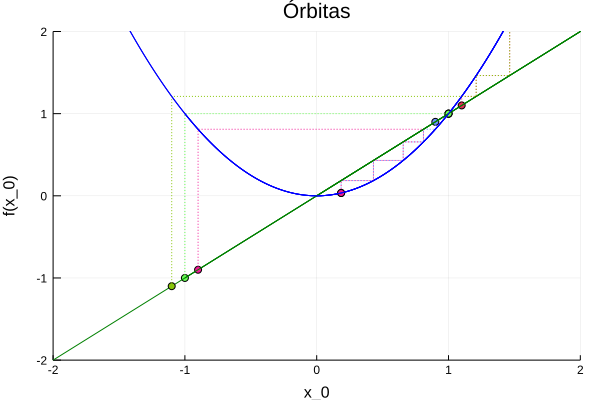

In [77]:
diagramaorbitas(f4,[0.9,1,1.1,-1,-0.9,-1.1],5)
plot!(xlims=(-2,2),ylims=(-2,2))

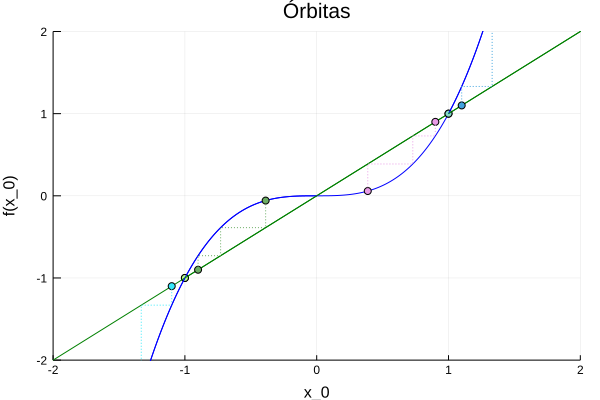

In [78]:
diagramaorbitas(f5,[0.9,1,1.1,-1,-0.9,-1.1],3)
plot!(xlims=(-2,2),ylims=(-2,2))

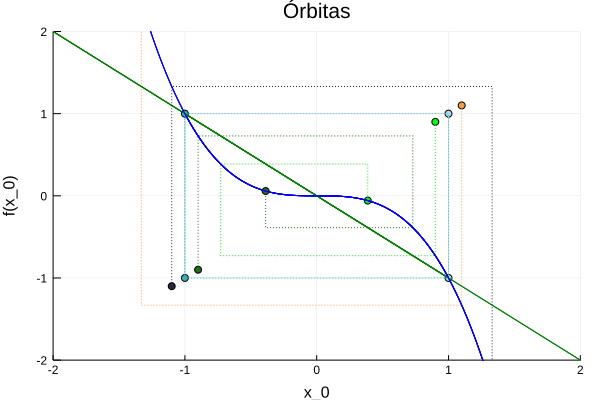

In [79]:
diagramaorbitas(f6,[0.9,1,1.1,-1,-0.9,-1.1],3,false)
plot!(xlims=(-2,2),ylims=(-2,2))

Podemos notar que el $0$ es un punto fijo atractivo en todos los casos.

## 7

Analicen los mapeos

- F(x) = x,

- F(x) = -x,

- F(x) = x-x^2,

que se satisface $F(0) = 0$ y $|F'(0)| = 1$. (Este tipo de puntos son *neutralmente* atractivos o repulsivos.) ¿Qué podemos decir de la convergencia?

In [80]:
f7(x)=x
f8(x)=-x
f9(x)=x-x^2

f9 (generic function with 1 method)

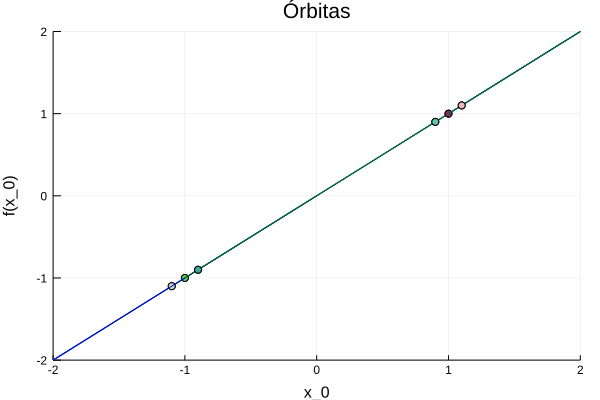

In [81]:
diagramaorbitas(f7,[0.9,1,1.1,-1,-0.9,-1.1],5)
plot!(xlims=(-2,2),ylims=(-2,2))

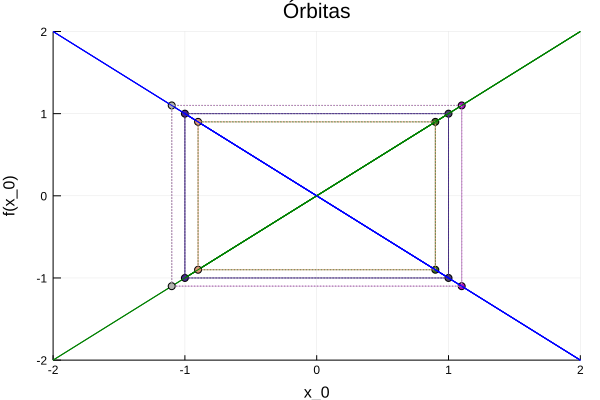

In [82]:
diagramaorbitas(f8,[0.9,1,1.1,-1,-0.9,-1.1],5,true)
plot!(xlims=(-2,2),ylims=(-2,2))

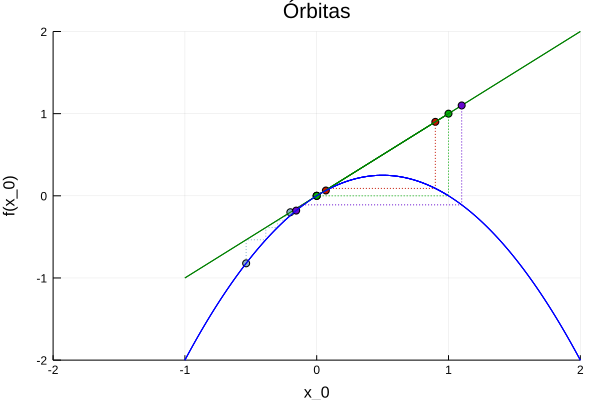

In [83]:
diagramaorbitas(f9,[0,-0.2,0.9,1,1.1],5)
plot!(xlims=(-2,2),ylims=(-2,2))

El $0$ no tiene un comportamiento común; pues para la primer función todos los puntos al rededor del $0$, para la segunda función todos los puntos generan órbitas de periodo dos, y la tercer función, en una vecindad del $0$, tiene un comportamiento atractor para los positivos y repulsor para los negativos.

## 8

En el ejercicio 3, implementaron el análisis gráfico (y el método de Newton) para encontrar los puntos de periodo dos del mapeo $F(x) = x^2 -1.1$. Usen el módulo de duales para mostrar la estabilidad de esos puntos.

In [84]:
f(x)=x^2-1.1
println(f(dual(-0.661895)).x′)
println(f(dual(1.661895)).x′)

-1.32379
3.32379


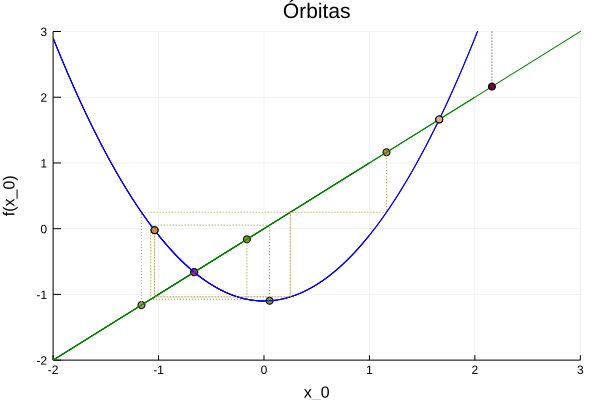

In [85]:
a=0.5
diagramaorbitas(f,[-0.661895-a,-0.661895,-0.661895+a,1.661895-a,1.661895,1.661895+a],3)
plot!(xlims=(-2,3),ylims=(-2,3))

Podemos ver cómo el punto negativo es un atractor, mientras que el positivo es un repulsor; esto coincide con que sus derivadas sean menor o mayor que 1.